In [14]:
import numpy as np
import os
import pyloudnorm as pyln
from openai import OpenAI

import sys, random  
sys.path.insert(0, '../')
import utils
from utils.audio_generation import sample, get_model
from utils.audio_processing import compress_spectrogram_simple, compress_spectrogram_with_centroid, \
equalize_audio, butter_bandpass_filter, pitch_shift_centroid,change_loudness

from IPython.display import Audio, display
from ipywidgets import widgets

%matplotlib inline
import matplotlib.pyplot as plt

In [15]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [16]:
import warnings

def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()

In [17]:
# model_name = 'audioldm_16k_crossattn_t5' # Smaller model; Less GPU memory ~[6-9]GB; 
model_name = 'audioldm2-full' # Larger model; More GPU memory ~[12-15] GB; 

#Audio params
loudness_dbfs = -14.0
sample_rate = 16000
stft_channels = 1024
hop_length = 128

# Diffusion params
guidance_scale = 3
n_candidates = 1
batch_size = 1
ddim_steps = 100

In [18]:
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [19]:
latent_diffusion = get_model(model_name)

Loading model
Loading AudioLDM-2: audioldm2-full
Loading model on cuda:0
{'log_directory': './log/audiomae_pred', 'precision': 'high', 'data': {'train': ['audiocaps', 'audioset', 'wavcaps', 'audiostock_music_250k', 'free_to_use_sounds', 'epidemic_sound_effects', 'vggsound', 'million_song_dataset'], 'val': 'audiocaps', 'test': 'audiocaps', 'class_label_indices': 'audioset', 'dataloader_add_ons': ['extract_kaldi_fbank_feature', 'extract_vits_phoneme_and_flant5_text', 'waveform_rs_48k']}, 'variables': {'sampling_rate': 16000, 'mel_bins': 64, 'latent_embed_dim': 8, 'latent_t_size': 256, 'latent_f_size': 16, 'in_channels': 8, 'optimize_ddpm_parameter': True, 'warmup_steps': 5000}, 'step': {'validation_every_n_epochs': 1, 'save_checkpoint_every_n_steps': 5000, 'limit_val_batches': 10, 'max_steps': 1500000, 'save_top_k': 2}, 'preprocessing': {'audio': {'sampling_rate': 16000, 'max_wav_value': 32768, 'duration': 10.24}, 'stft': {'filter_length': 1024, 'hop_length': 160, 'win_length': 1024}, 'm

OutOfMemoryError: CUDA out of memory. Tried to allocate 12.00 MiB. GPU 0 has a total capacty of 23.48 GiB of which 7.94 MiB is free. Process 7025 has 11.07 GiB memory in use. Including non-PyTorch memory, this process has 12.37 GiB memory in use. Of the allocated memory 12.00 GiB is allocated by PyTorch, and 127.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

# Foley Interpreter

In [ ]:
with open('../config/.env', 'r') as fh:
    vars_dict = dict(
        tuple(line.replace('\n', '').split('='))
        for line in fh.readlines() if not line.startswith('#')
    )

os.environ.update(vars_dict)

In [ ]:
client = OpenAI()
def foley_interpreter(txt):
    # content = "Describe a language phrase consisting of a noun verb adjective adverb like "+\
    #         "'a brown cat running purposefully and quickly' that would be a sound which could be also perceivable "+\
    #         "as touch sensation and resembles "+txt+". Use simple words and long descriptions when generating the language phrase. "+\
    #         "Ensure the language phrase is in double quotes."
    content = "Describe a language phrase consisting of a noun, verb, adverb like "+\
                "'a brown cat running purposefully and quickly' that resembles "+txt+" and indicates a sound events occuring and is also perceivable as a touch sensation. "+\
                "Use simple words when generating the language phrase. Ensure the language phrase is in double quotes."
    
    response = client.chat.completions.create(
      model="gpt-3.5-turbo",
      messages=[
         {"role": "system", "content": "You are a helpful assistant."},
        {"role": "user", "content": content}
      ]
    )

    foley_language_phrase = response.choices[0].message.content
    print(foley_language_phrase)
    print(foley_language_phrase.split('"')[1])
    return foley_language_phrase.split('"')[1]
    

# AI Audio Generator

In [ ]:
def audio_generator(foley_language_phrase, latent_diffusion, random_seed):
    audio = sample(latent_diffusion, foley_language_phrase, batch_size=1, ddim_steps=100, guidance_scale=3.0, \
             random_seed=random_seed, disable_tqdmoutput=False)

    return audio

# Dynamic Audio Converter

In [ ]:
def audio_post_processor(audio, freq_limit, hop_length, stft_channels, sample_rate, loudness):

    loudness_meter = pyln.Meter(sample_rate)

    print('Processing Original')
    original = change_loudness(audio, loudness, loudness_meter)
    print('Processing Original + Low Pass')
    original_w_lp = butter_bandpass_filter(audio, highcut=1000, fs=sample_rate, lowcut=None, order=2, btype='lowpass')
    print('Processing Original + Low Pass + Pitch Shifted')
    original_w_pitchshifted = pitch_shift_centroid(original_w_lp, limit=250, sample_rate=sample_rate, loudness_meter=loudness_meter, loudness=loudness)
    print('Processing Wav Compressed + Centroid')
    wav_compressed_w_centroid = compress_spectrogram_with_centroid(audio, limit=freq_limit, hop_length=hop_length, stft_channels=stft_channels, \
                                                    sample_rate=sample_rate, loudness_meter=loudness_meter, loudness=loudness)


    print('Processing Original + Equalized')
    original_equalized = equalize_audio(audio, sample_rate, loudness_meter=loudness_meter, loudness=loudness)
    print('Processing Original + Low Pass + Equalized')
    original_w_lp_equalized = equalize_audio(original_w_lp, sample_rate, loudness_meter=loudness_meter, loudness=loudness)
    print('Processing Original + Low Pass + Pitch Shifted + Equalized')
    original_w_pitchshifted_equalized = equalize_audio(original_w_pitchshifted, sample_rate, loudness_meter=loudness_meter, loudness=loudness)
    print('Processing Wav Compressed + Centroid + Equalized')
    wav_compressed_w_centroid_equalized = equalize_audio(wav_compressed_w_centroid, sample_rate, loudness_meter=loudness_meter, loudness=loudness)

    _ = {\
         'Original': original, \
         'Original + Low Pass': original_w_lp, \
         'Original + Low Pass + Pitch Shifted': original_w_pitchshifted, \
         'Wav Compressed + Centroid': wav_compressed_w_centroid, \
         'Original + Equalized ': original_equalized,\
         'Original + Low Pass + Equalized': original_w_lp_equalized,\
         'Original + Low Pass + Pitch Shifted + Equalized': original_w_pitchshifted_equalized, \
         'Wav Compressed + Centroid + Equalized':wav_compressed_w_centroid_equalized\
        }
    return _

# Examples

In [ ]:
prompt = "A movie character falling to the ground." 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
foley_language_phrase = foley_interpreter(prompt)
audio = audio_generator(foley_language_phrase, latent_diffusion, random_num)
audio_c = audio_post_processor(audio, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, sample_rate=sample_rate, loudness=-30)


all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles)

audio_widgets = []
for aud in all_wavs[:4]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[4:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  5364
"a door slamming loudly and forcefully"
a door slamming loudly and forcefully


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:13<00:00,  7.40it/s]


Processing Original
Loudness before =  -23.77773032244373
Loudness after =  -30.0000001705583
Processing Original + Low Pass
Processing Original + Low Pass + Pitch Shifted
Mean Spectral Centroid =  503.06042098898746  Pitch Shift Steps =  12.105643116818747
Loudness before =  -20.999224269368277
Loudness after =  -29.999999999999996
Processing Wav Compressed + Centroid
Mean Spectral Centroid =  1383.8738945020789
Loudness before =  -22.055872089769725
Loudness after =  -30.000000000000007
Processing Original + Equalized
Loudness before =  -22.690220227611025
Loudness after =  -30.000000000000004
Processing Original + Low Pass + Equalized
Loudness before =  -20.519255782231735
Loudness after =  -29.999999999999996
Processing Original + Low Pass + Pitch Shifted + Equalized
Loudness before =  -18.816713837497304
Loudness after =  -30.000000000000004
Processing Wav Compressed + Centroid + Equalized
Loudness before =  -20.519948612622166
Loudness after =  -30.000000000000004
num rows= 2


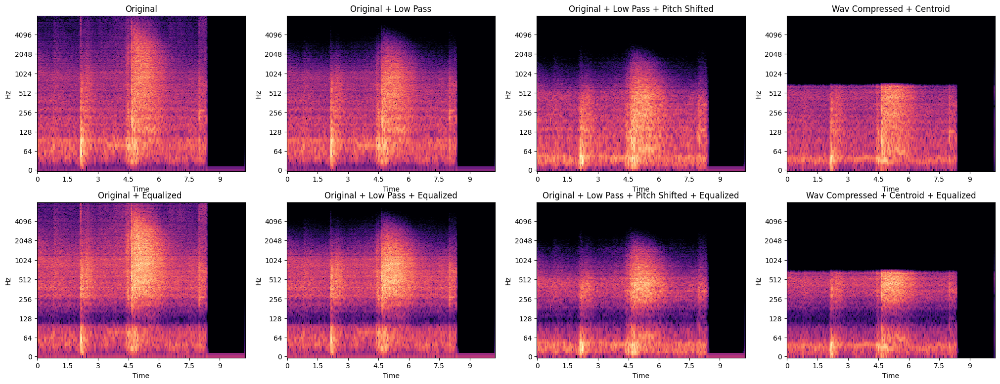

In [20]:
prompt = "A car crashes into another car." 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
foley_language_phrase = foley_interpreter(prompt)
audio = audio_generator(foley_language_phrase, latent_diffusion, random_num)
audio_c = audio_post_processor(audio, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, sample_rate=sample_rate, loudness=-30)


all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles)

audio_widgets = []
for aud in all_wavs[:4]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[4:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  4621
"Soft droplets tapping gently and steadily"
Soft droplets tapping gently and steadily


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:13<00:00,  7.33it/s]


Processing Original
Loudness before =  -27.077886345284423
Loudness after =  -29.99999970022841
Processing Original + Low Pass
Processing Original + Low Pass + Pitch Shifted
Mean Spectral Centroid =  870.3295816534708  Pitch Shift Steps =  21.595604856001778
Loudness before =  -17.917710120034616
Loudness after =  -30.000000000000004
Processing Wav Compressed + Centroid
Mean Spectral Centroid =  3396.741659148801
Loudness before =  -28.821987142736393
Loudness after =  -29.999999999999996
Processing Original + Equalized
Loudness before =  -27.49279800429997
Loudness after =  -30.000000000000004
Processing Original + Low Pass + Equalized
Loudness before =  -27.291332389325856
Loudness after =  -29.999999999999993
Processing Original + Low Pass + Pitch Shifted + Equalized
Loudness before =  -23.140612441173666
Loudness after =  -29.999999999999993
Processing Wav Compressed + Centroid + Equalized
Loudness before =  -29.619052690033524
Loudness after =  -30.000000000000007
num rows= 2


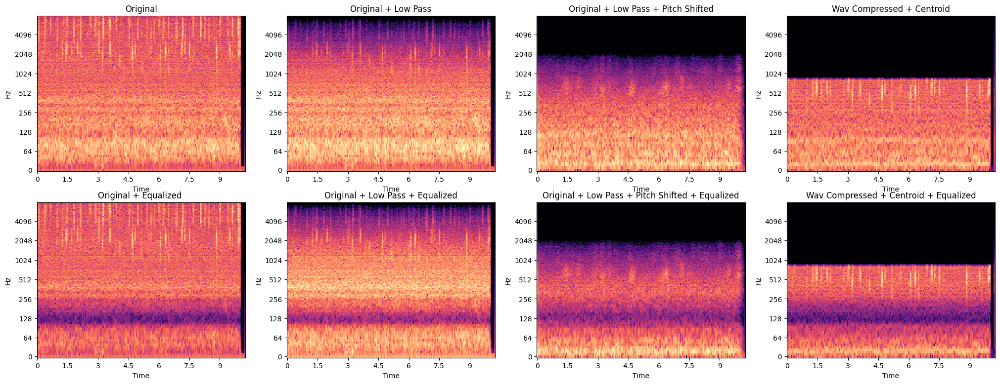

In [19]:
prompt = "Raindrops falling on the hand." 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
foley_language_phrase = foley_interpreter(prompt)
audio = audio_generator(foley_language_phrase, latent_diffusion, random_num)
audio_c = audio_post_processor(audio, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, sample_rate=sample_rate, loudness=-30)


all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles)

audio_widgets = []
for aud in all_wavs[:4]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[4:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  7216
"Crunchy chips sizzling enticingly and crisply"
Crunchy chips sizzling enticingly and crisply


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:13<00:00,  7.52it/s]


Processing Original
Loudness before =  -28.717118890104818
Loudness after =  -29.999999832293625
Processing Original + Low Pass
Processing Original + Low Pass + Pitch Shifted
Mean Spectral Centroid =  1486.0998070130202  Pitch Shift Steps =  30.858372132758014
Loudness before =  -18.883772621861446
Loudness after =  -29.99999999999999
Processing Wav Compressed + Centroid
Mean Spectral Centroid =  4252.944550441913
Loudness before =  -27.489587094964715
Loudness after =  -29.999999999999996
Processing Original + Equalized
Loudness before =  -28.887447521072154
Loudness after =  -30.000000000000004
Processing Original + Low Pass + Equalized
Loudness before =  -30.183236064279225
Loudness after =  -29.999999999999996
Processing Original + Low Pass + Pitch Shifted + Equalized
Loudness before =  -20.839788844269908
Loudness after =  -29.999999999999993
Processing Wav Compressed + Centroid + Equalized
Loudness before =  -27.41027001802495
Loudness after =  -30.000000000000004
num rows= 2


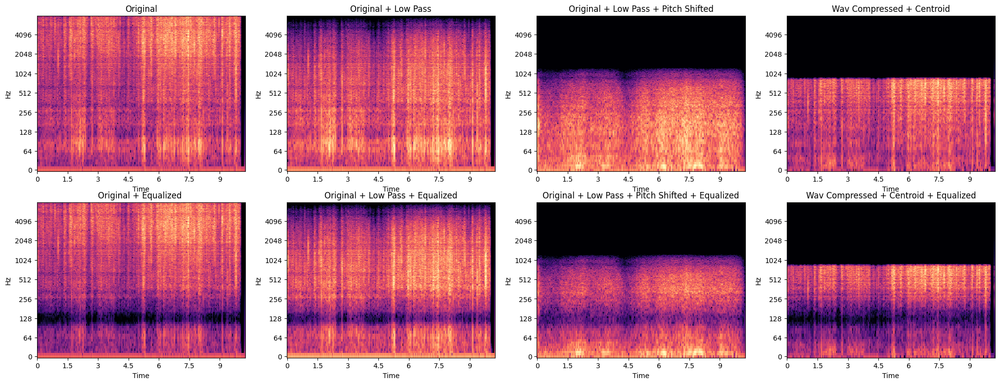

In [21]:
prompt = "Confirming a menu item." 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
foley_language_phrase = foley_interpreter(prompt)
audio = audio_generator(foley_language_phrase, latent_diffusion, random_num)
audio_c = audio_post_processor(audio, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, sample_rate=sample_rate, loudness=-30)


all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles)

audio_widgets = []
for aud in all_wavs[:4]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[4:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  8579
"Metallic paper crumpling loudly and abruptly"
Metallic paper crumpling loudly and abruptly


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:13<00:00,  7.20it/s]


Processing Original
Loudness before =  -27.511879949517702
Loudness after =  -30.000000347752504
Processing Original + Low Pass
Processing Original + Low Pass + Pitch Shifted
Mean Spectral Centroid =  1502.91442372129  Pitch Shift Steps =  31.05315437062994
Loudness before =  -18.489702971832806
Loudness after =  -29.999999999999993
Processing Wav Compressed + Centroid
Mean Spectral Centroid =  3994.1969491030973
Loudness before =  -29.016414987782394
Loudness after =  -29.999999999999996
Processing Original + Equalized
Loudness before =  -28.060258830953845
Loudness after =  -30.000000000000004
Processing Original + Low Pass + Equalized
Loudness before =  -28.235395299889234
Loudness after =  -29.999999999999996
Processing Original + Low Pass + Pitch Shifted + Equalized
Loudness before =  -18.233349962335744
Loudness after =  -30.000000000000004
Processing Wav Compressed + Centroid + Equalized
Loudness before =  -29.127867842015487
Loudness after =  -30.000000000000004
num rows= 2


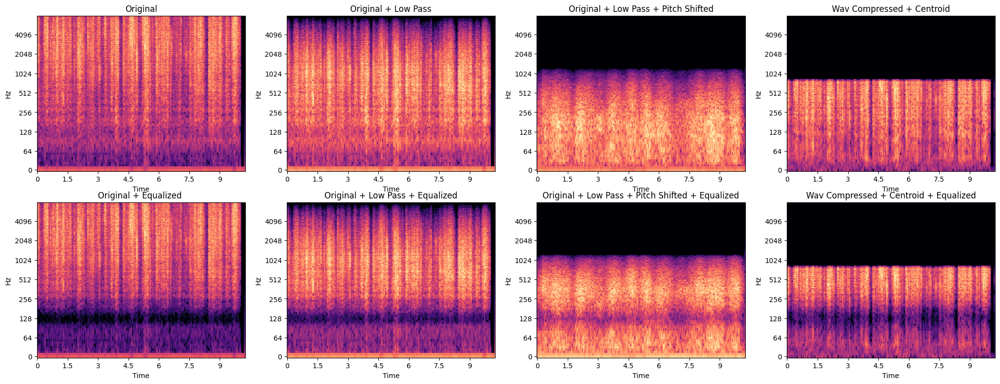

In [22]:
prompt = "Moving a desktop file into the virtual desktop trashcan." 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
foley_language_phrase = foley_interpreter(prompt)
audio = audio_generator(foley_language_phrase, latent_diffusion, random_num)
audio_c = audio_post_processor(audio, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, sample_rate=sample_rate, loudness=-30)


all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles)

audio_widgets = []
for aud in all_wavs[:4]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[4:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  6607
"Joyful bells chiming softly and rhythmically"
Joyful bells chiming softly and rhythmically


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:13<00:00,  7.35it/s]


Processing Original
Loudness before =  -16.805925998969272
Loudness after =  -29.99999996784341
Processing Original + Low Pass
Processing Original + Low Pass + Pitch Shifted
Mean Spectral Centroid =  851.0582120484481  Pitch Shift Steps =  21.207956642096725
Loudness before =  -15.468703680473823
Loudness after =  -29.999999999999996
Processing Wav Compressed + Centroid
Mean Spectral Centroid =  2341.5090590968757
Loudness before =  -16.19378994949233
Loudness after =  -30.000000000000004
Processing Original + Equalized
Loudness before =  -17.16247736264863
Loudness after =  -30.000000000000004
Processing Original + Low Pass + Equalized
Loudness before =  -16.276226136495623
Loudness after =  -29.999999999999996
Processing Original + Low Pass + Pitch Shifted + Equalized
Loudness before =  -16.091498436432726
Loudness after =  -29.999999999999996
Processing Wav Compressed + Centroid + Equalized
Loudness before =  -18.069001016312583
Loudness after =  -30.000000000000004
num rows= 2


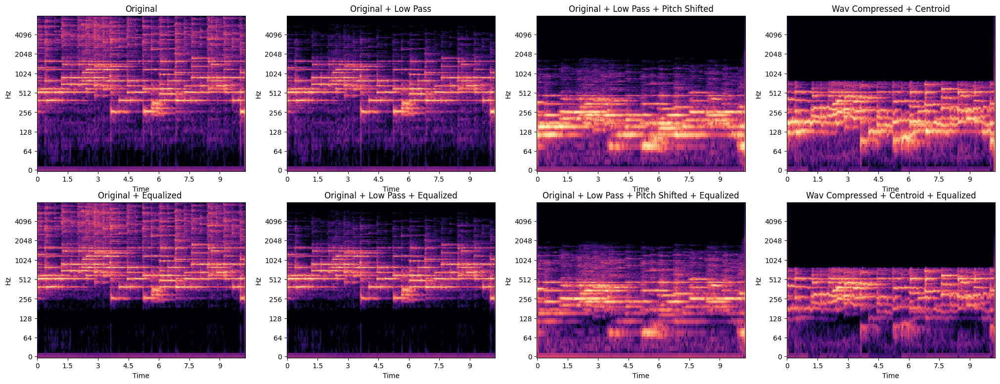

In [30]:
prompt = "Receiving a happy message." 

random_num = np.random.randint(0,10000) #1931 #a joyful bell ringing gently and warmly
print('Random num = ', random_num)
foley_language_phrase = foley_interpreter(prompt)
audio = audio_generator(foley_language_phrase, latent_diffusion, random_num)
audio_c = audio_post_processor(audio, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, sample_rate=sample_rate, loudness=-30)


all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles)

audio_widgets = []
for aud in all_wavs[:4]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[4:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  3904
"Soft whisper sighing gently and sadly"
Soft whisper sighing gently and sadly


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:13<00:00,  7.30it/s]


Processing Original
Loudness before =  -24.379497511198196
Loudness after =  -30.00000040664255
Processing Original + Low Pass
Processing Original + Low Pass + Pitch Shifted
Mean Spectral Centroid =  842.3474818754756  Pitch Shift Steps =  21.029848752989935
Loudness before =  -25.31248460874095
Loudness after =  -30.000000000000004
Processing Wav Compressed + Centroid
Mean Spectral Centroid =  2402.7198735749275
Loudness before =  -27.147375840376398
Loudness after =  -29.999999999999996
Processing Original + Equalized
Loudness before =  -24.20964498073396
Loudness after =  -30.000000000000004
Processing Original + Low Pass + Equalized
Loudness before =  -25.429139758497726
Loudness after =  -30.000000000000004
Processing Original + Low Pass + Pitch Shifted + Equalized
Loudness before =  -24.883167376866258
Loudness after =  -29.999999999999996
Processing Wav Compressed + Centroid + Equalized
Loudness before =  -26.458020948225048
Loudness after =  -30.000000000000007
num rows= 2


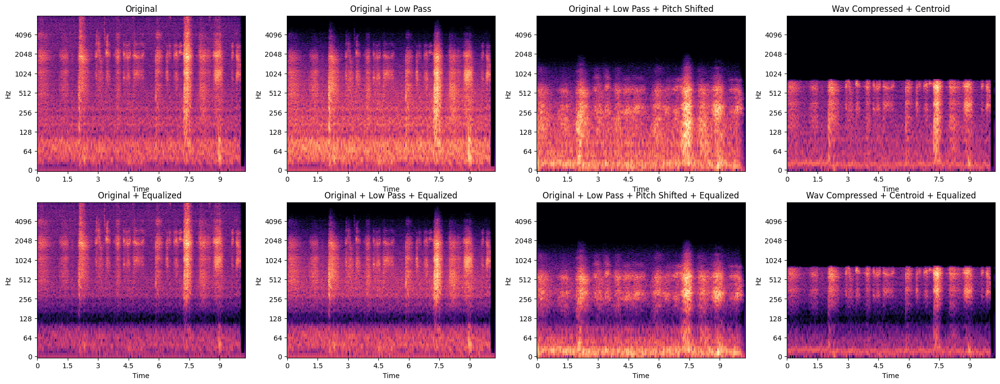

In [32]:
prompt = "Receiving a sad message." 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
foley_language_phrase = foley_interpreter(prompt)
audio = audio_generator(foley_language_phrase, latent_diffusion, random_num)
audio_c = audio_post_processor(audio, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, sample_rate=sample_rate, loudness=-30)


all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles)

audio_widgets = []
for aud in all_wavs[:4]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[4:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])

Random num =  1096
"A loud slamming door aggressively hitting your arm"
A loud slamming door aggressively hitting your arm


DDIM Sampler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:13<00:00,  7.25it/s]


Processing Original
Loudness before =  -21.38643242451775
Loudness after =  -29.999999634927565
Processing Original + Low Pass
Processing Original + Low Pass + Pitch Shifted
Mean Spectral Centroid =  584.683510618146  Pitch Shift Steps =  14.708733717342362
Loudness before =  -21.523586848306884
Loudness after =  -29.999999999999993
Processing Wav Compressed + Centroid
Mean Spectral Centroid =  1756.3604803840283
Loudness before =  -20.14403017176147
Loudness after =  -30.000000000000004
Processing Original + Equalized
Loudness before =  -19.819286306006685
Loudness after =  -30.000000000000004
Processing Original + Low Pass + Equalized
Loudness before =  -19.935169467763167
Loudness after =  -30.000000000000004
Processing Original + Low Pass + Pitch Shifted + Equalized
Loudness before =  -24.13953109576151
Loudness after =  -30.000000000000004
Processing Wav Compressed + Centroid + Equalized
Loudness before =  -21.784070531077397
Loudness after =  -29.999999999999996
num rows= 2


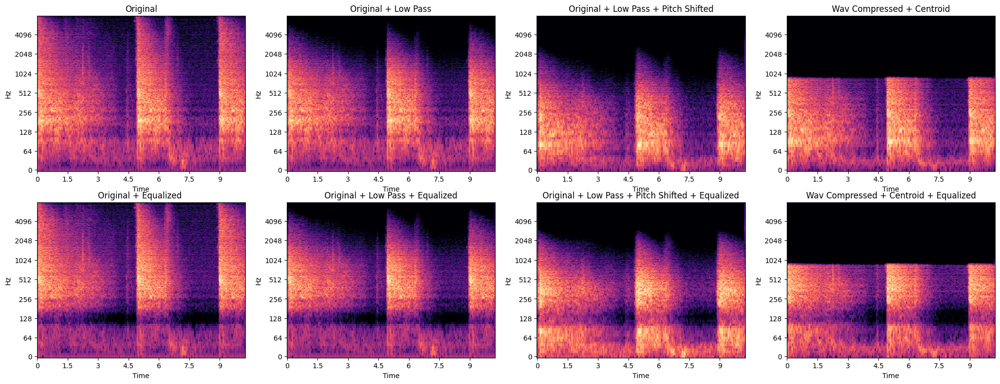

In [31]:
prompt = "Receiving an angry message." 

random_num = np.random.randint(0,10000)
print('Random num = ', random_num)
foley_language_phrase = foley_interpreter(prompt)
audio = audio_generator(foley_language_phrase, latent_diffusion, random_num)
audio_c = audio_post_processor(audio, freq_limit=1000, hop_length=hop_length, stft_channels=stft_channels, sample_rate=sample_rate, loudness=-30)


all_wavs = []
all_titles = []
for key in audio_c:
    all_wavs.append(audio_c[key])
    all_titles.append(key)

utils.plot_all(all_wavs, all_titles)

audio_widgets = []
for aud in all_wavs[:4]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
top_box = widgets.HBox(audio_widgets)

audio_widgets = []
for aud in all_wavs[4:]:
    out = widgets.Output()
    with out:
        display(Audio(data=aud, rate=sample_rate))
    audio_widgets.append(out)
bottom_box = widgets.HBox(audio_widgets)

widgets.VBox([top_box, bottom_box])